In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [110]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("walkrun_clean.csv",index_col=0)

In [17]:
df['date_time'] =  pd.to_datetime(df['date_time'], format='%Y-%m-%d %H:%M:%S.%f')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88588 entries, 0 to 88587
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   activity        88588 non-null  int64         
 1   acceleration_x  88588 non-null  float64       
 2   acceleration_y  88588 non-null  float64       
 3   acceleration_z  88588 non-null  float64       
 4   gyro_x          88588 non-null  float64       
 5   gyro_y          88588 non-null  float64       
 6   gyro_z          88588 non-null  float64       
 7   date_time       88588 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(6), int64(1)
memory usage: 8.1 MB


In [19]:
df.head()

,activity,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,date_time
0,0,0.2650,-0.7814,-0.0076,-0.0590,0.0325,-2.9296,2017-06-30 13:51:15.847724020
1,0,0.6722,-1.1233,-0.2344,-0.1757,0.0208,0.1269,2017-06-30 13:51:16.246945023
2,0,0.4399,-1.4817,0.0722,-0.9105,0.1063,-2.4367,2017-06-30 13:51:16.446233987
3,0,0.3031,-0.8125,0.0888,0.1199,-0.4099,-2.9336,2017-06-30 13:51:16.646117985
4,0,0.4814,-0.9312,0.0359,0.0527,0.4379,2.4922,2017-06-30 13:51:16.846738994


In [20]:
df.tail()

,activity,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,date_time
88583,1,-0.3145,-0.5619,0.2554,-1.4393,0.1370,-1.5961,2017-07-17 20:16:02.884990990
88584,1,0.2041,0.4117,-0.1134,0.8280,0.8089,1.9331,2017-07-17 20:16:03.285188019
88585,1,-2.9406,0.4090,0.0523,2.2648,0.2342,3.7748,2017-07-17 20:16:03.485148012
88586,1,-0.0219,-0.5711,0.1658,0.2210,-1.5538,0.6392,2017-07-17 20:16:03.684989988
88587,1,-2.1825,0.1876,0.0430,-2.2937,-0.6059,-0.6293,2017-07-17 20:16:03.851119750


# Here X are acceleration_x, acceleration_y,acceleration_z, gyro_x, gyro_y, gyro_z and Y is Activity

In [21]:
# Checking for class imbalance
df.activity.value_counts()

1    44365
0    44223
Name: activity, dtype: int64

# 0 is walking
# 1 is Running

C:\Users\Shivah Sae\.conda\envs\ai\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


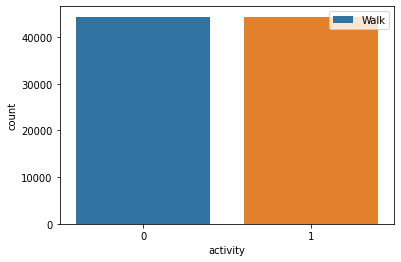

In [22]:
sns.countplot(df.activity)
plt.legend(["Walk"])

##### The value count of both walk class and run class are almost same.
##### Hence the dataset is not imbalanced

# acceleration_x vs activity

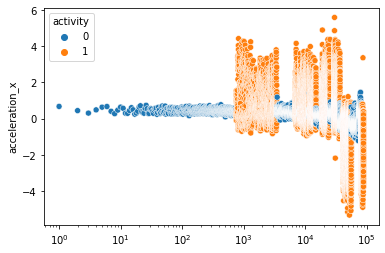

In [117]:
sns.scatterplot(range(len(df)),df.acceleration_x,hue=df.activity)
plt.xscale("log")

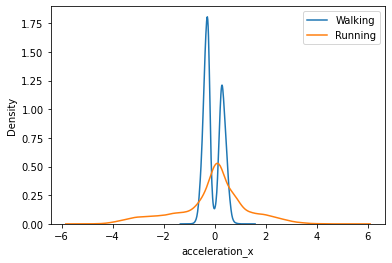

In [118]:
sns.distplot(df.acceleration_x[df.activity==0],hist=False,label="Walking")
sns.distplot(df.acceleration_x[df.activity==1],hist=False,label="Running")
plt.legend()

# Observations:
* The value of acceleration_x for walking ranges from -2 to 2
* The value of acceleration_x for runing is from 6 to -6 

# acceleration_y vs activity

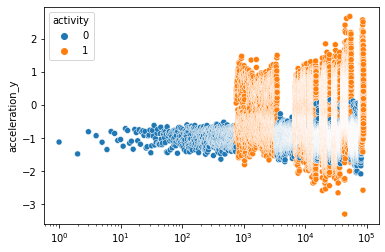

In [114]:
sns.scatterplot(range(len(df)),df.acceleration_y,hue=df.activity)
plt.xscale("log")

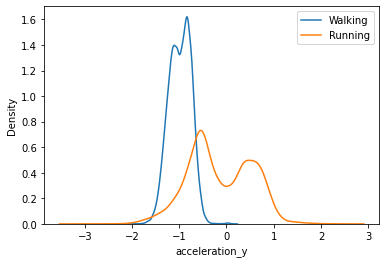

In [115]:
sns.distplot(df.acceleration_y[df.activity==0],hist=False,label="Walking")
sns.distplot(df.acceleration_y[df.activity==1],hist=False,label="Running")
plt.legend()

# Observations:
* The value of acceleration_y for walking ranges from 0 to -2
* The value of acceleration_y for runing is from -3 to 3



We can say that for walking class, acceleration_y is always negative

# acceleration_z vs activity

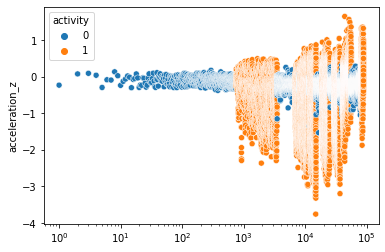

In [124]:
sns.scatterplot(range(len(df)),df.acceleration_z,hue=df.activity)
plt.xscale("log")

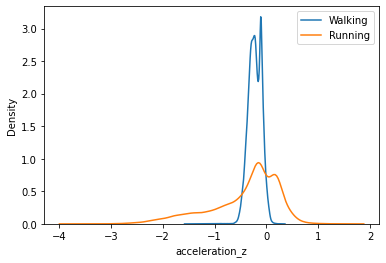

In [125]:
sns.distplot(df.acceleration_z[df.activity==0],hist=False,label="Walking")
sns.distplot(df.acceleration_z[df.activity==1],hist=False,label="Running")
plt.legend()

# Observations:
* The value of acceleration_z for walking ranges from 0 to -1
* The value of acceleration_y for runing is from 2 to -3



We can say that for walking class, acceleration_z is always negative

In [126]:
import plotly.express as px

In [168]:
px.scatter_3d(df,x="acceleration_x",y="acceleration_y",z="acceleration_z",color="activity")

# Observations on walk class
* The value of acceleration x  for walking ranges from -1.6 to 1.4
* The value of acceleration y  for walking ranges from  -0.3  to 2
* The value of acceleration z  for walking ranges from -1.3 to 0.3

# Observations on Run class
* The value of acceleration x  for walking ranges from -4.8 to 5
* The value of acceleration y  for walking ranges from  -3.2  to 2.5
* The value of acceleration z  for walking ranges from -3.6 to 1.5

# gyro_x vs activity

<AxesSubplot:ylabel='gyro_x'>

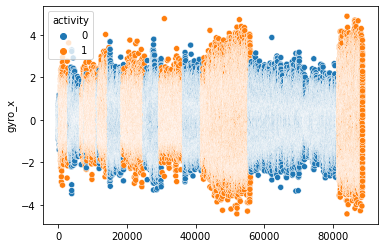

In [135]:
sns.scatterplot(range(len(df)),df.gyro_x,hue=df.activity)
#plt.xscale("log")

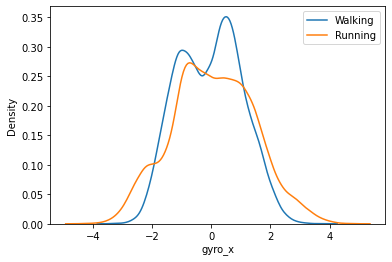

In [145]:
sns.distplot(df.gyro_x[df.activity==0],hist=False,label="Walking")
sns.distplot(df.gyro_x[df.activity==1],hist=False,label="Running")
plt.legend()

# gyro_y vs activity

<AxesSubplot:ylabel='gyro_y'>

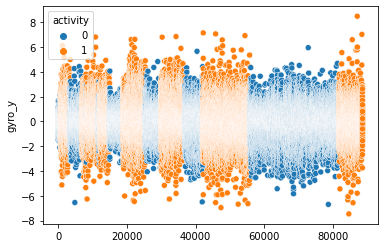

In [138]:
sns.scatterplot(range(len(df)),df.gyro_y,hue=df.activity)
#plt.xscale("log")

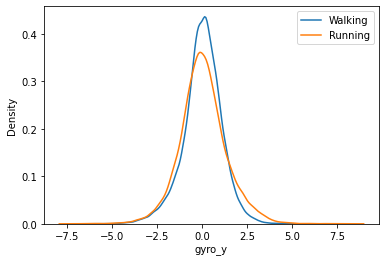

In [144]:
sns.distplot(df.gyro_y[df.activity==0],hist=False,label="Walking")
sns.distplot(df.gyro_y[df.activity==1],hist=False,label="Running")
plt.legend()

# gyro_z vs activity

<AxesSubplot:ylabel='gyro_z'>

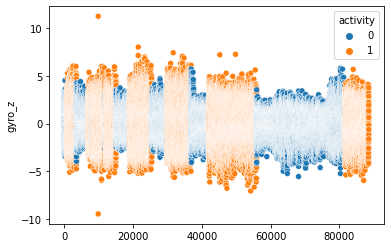

In [140]:
sns.scatterplot(range(len(df)),df.gyro_z,hue=df.activity)
#plt.xscale("log")

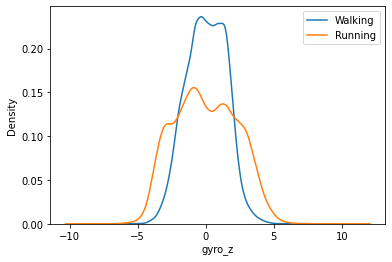

In [143]:
sns.distplot(df.gyro_z[df.activity==0],hist=False,label="Walking")
sns.distplot(df.gyro_z[df.activity==1],hist=False,label="Running")
plt.legend()

In [167]:
px.scatter_3d(df,x="gyro_x",y="gyro_y",z="gyro_z",color="activity")

# Observations

   * Since, gyroscopic sensor measures the rotation of the axis with respect to gravitational force. Run Class and Walk class can't be determined by the direction of the movement. So, walk and run class can't be determined by gyroscopic sensor as shown form the above plots
   * Accelerometric sensor determines the linear accleration with respect to the 3 axes. so acclerometric sensor is prominent in determining the walk or run class 

# Pairplot for overview of distributions

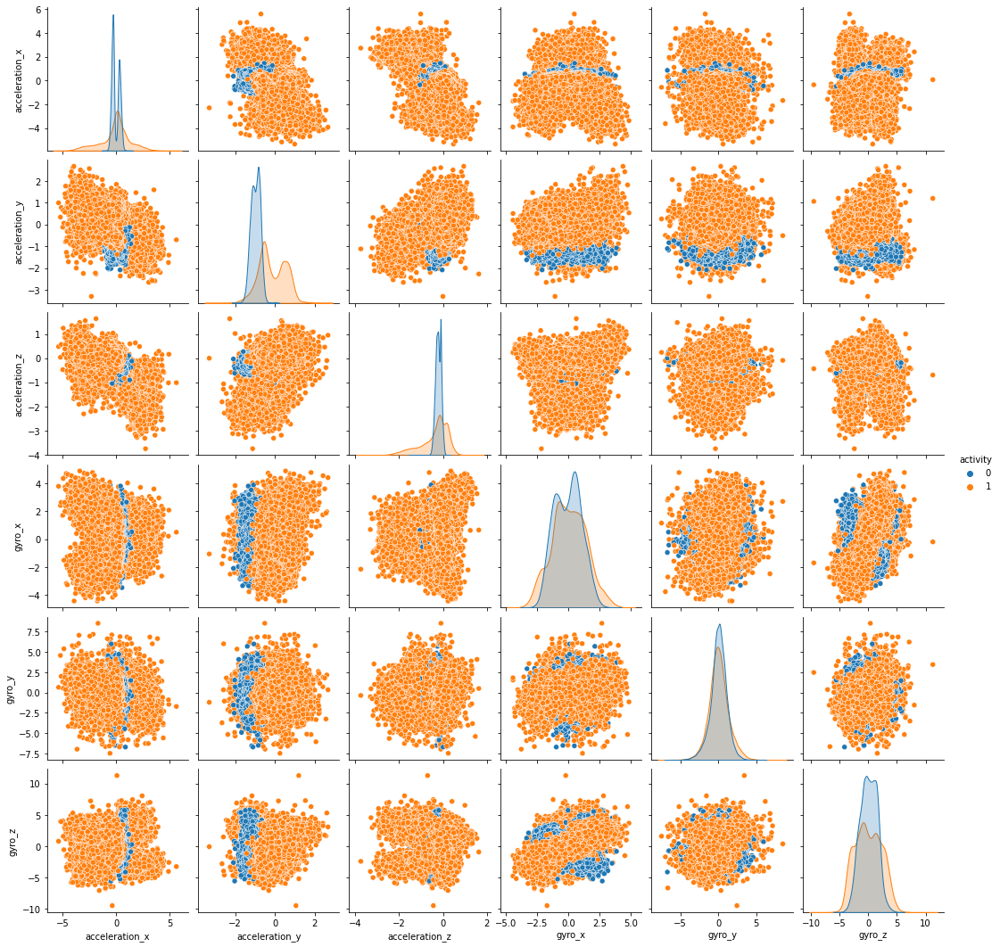

In [149]:
sns.pairplot(df.iloc[:,:7],hue="activity")

<AxesSubplot:xlabel='activity', ylabel='gyro_z'>

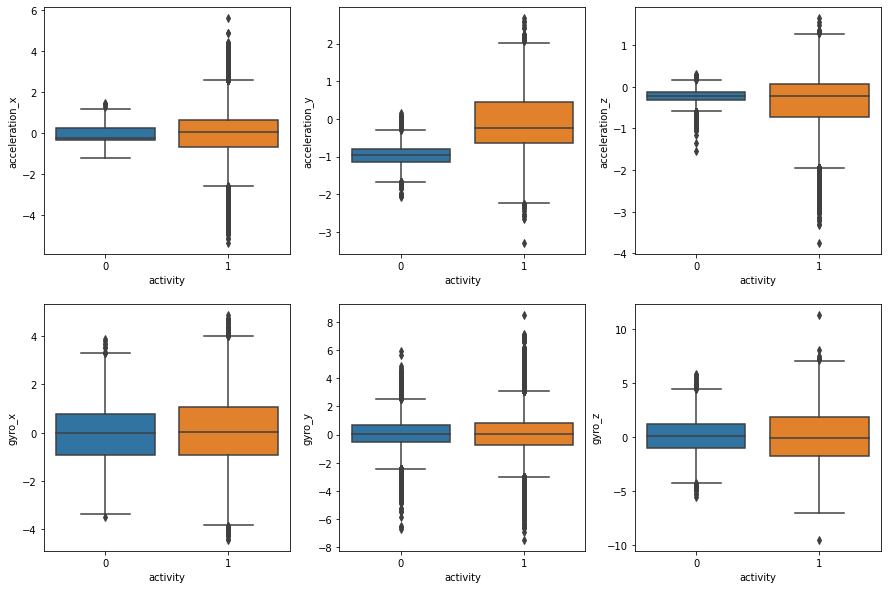

In [166]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x="activity",y="acceleration_x",data=df)
plt.subplot(2,3,2)
sns.boxplot(x="activity",y="acceleration_y",data=df)
plt.subplot(2,3,3)
sns.boxplot(x="activity",y="acceleration_z",data=df)
plt.subplot(2,3,4)
sns.boxplot(x="activity",y="gyro_x",data=df)
plt.subplot(2,3,5)
sns.boxplot(x="activity",y="gyro_y",data=df)
plt.subplot(2,3,6)
sns.boxplot(x="activity",y="gyro_z",data=df)

# Observation from above plottings we can say that acceleration_y helps better in classification of walk or run class with more than 85% accuracy